Lab Assignment 3: BL.EN.U4AIE23026

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# Install required libraries
!pip install librosa soundfile matplotlib numpy scipy noisereduce

#Import libraries
import numpy as np
import librosa
import librosa.display
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
import soundfile as sf
import noisereduce as nr

Sampling Rate: 16000
Signal Length: 121344
Preprocessed file saved as: preprocessed_speech.wav


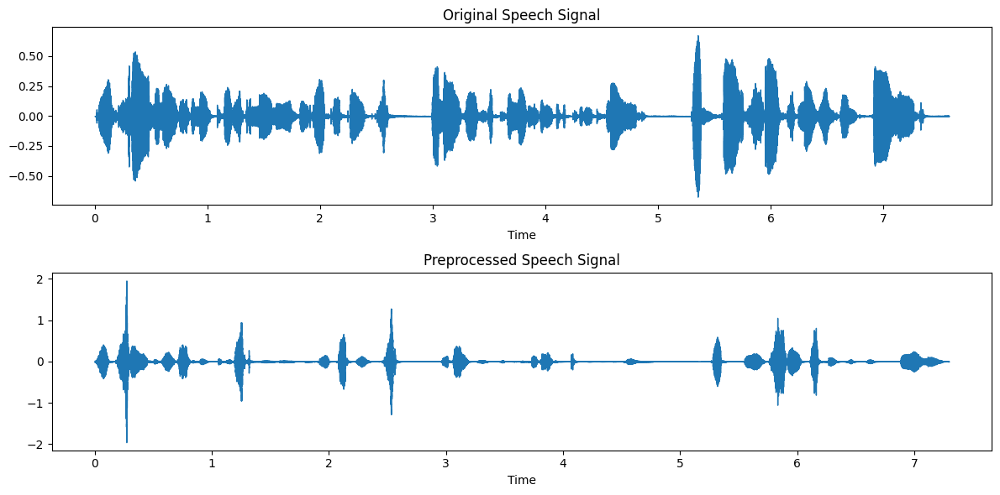

In [6]:
import librosa
import librosa.display
import numpy as np
import noisereduce as nr
import soundfile as sf
import matplotlib.pyplot as plt

def process_audio_stream(path, rate=16000, emphasis=0.97):
    """
    Handles the ingestion, cleaning, and filtering of audio data.
    """
    raw, fs = librosa.load(path, sr=rate)
    data = np.mean(raw, axis=1) if raw.ndim > 1 else raw
    clean = nr.reduce_noise(y=data, sr=fs)
    norm = clean / np.max(np.abs(clean))
    active_segment, _ = librosa.effects.trim(norm, top_db=20)
    refined = np.append(active_segment[0], active_segment[1:] - emphasis * active_segment[:-1])

    return raw, refined, fs
input_file = "/content/LJ037-0171.wav"
output_file = "preprocessed_speech.wav"
original, processed, sampling_rate = process_audio_stream(input_file)
sf.write(output_file, processed, sampling_rate)
print(f"Workflow complete. Artifact saved to: {output_file}")
fig, ax = plt.subplots(2, 1, figsize=(12, 6), sharex=True)
for i, (sig, lbl) in enumerate([(original, "Original"), (processed, "Refined")]):
    librosa.display.waveshow(sig, sr=sampling_rate, ax=ax[i])
    ax[i].set_title(f"{lbl} Signal Architecture")
plt.tight_layout()
plt.show()

In [7]:
import torch
import librosa
from transformers import Wav2Vec2Processor, Wav2Vec2ForCTC

class PhonemeExtractor:
    def __init__(self, model_id="facebook/wav2vec2-base-960h"):
        self.processor = Wav2Vec2Processor.from_pretrained(model_id)
        self.model = Wav2Vec2ForCTC.from_pretrained(model_id)

    def process(self, audio_path):
        speech, sr = librosa.load(audio_path, sr=16000)
        inputs = self.processor(speech, sampling_rate=sr, return_tensors="pt")
        with torch.no_grad():
            logits = self.model(inputs.input_values).logits

        return speech, logits, sr

    def get_temporal_segments(self, speech, logits, sr):
        predicted_ids = torch.argmax(logits, dim=-1)[0]
        num_frames = logits.shape[1]
        time_scale = (len(speech) / sr) / num_frames

        segments = []
        start_idx = 0
        for i, token_id in enumerate(predicted_ids):
            if i == len(predicted_ids) - 1 or token_id != predicted_ids[i + 1]:
                char = self.processor.tokenizer.decode([token_id.item()])
                if char.strip():
                    t_start = start_idx * time_scale
                    t_end = (i + 1) * time_scale
                    segments.append({
                        "char": char,
                        "start": t_start,
                        "end": t_end,
                        "duration": t_end - t_start
                    })
                start_idx = i + 1
        return segments
engine = PhonemeExtractor()
audio_file = "/content/LJ037-0171.wav"
raw_audio, output_logits, sample_rate = engine.process(audio_file)
alignment = engine.get_temporal_segments(raw_audio, output_logits, sample_rate)
print(f"{'Token':<8} | {'Start':<8} | {'End':<8}")
print("-" * 30)
with open("phoneme_segments.txt", "w") as f:
    for seg in alignment:
        line = f"{seg['char']:<8} | {seg['start']:<8.3f} | {seg['end']:<8.3f}"
        print(line)
        f.write(f"{seg['char']},{seg['start']:.3f},{seg['end']:.3f}\n")

Sampling Rate: 16000
Audio Duration (sec): 7.584


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/159 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

tokenizer_config.json:   0%|          | 0.00/163 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/291 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/85.0 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/378M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/212 [00:00<?, ?it/s]

Wav2Vec2ForCTC LOAD REPORT from: facebook/wav2vec2-base-960h
Key                        | Status  | 
---------------------------+---------+-
wav2vec2.masked_spec_embed | MISSING | 

Notes:
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.



Recognized Phoneme/Character Sequence:

THE EXAMINATION AND TESTIMONY OF THE EXPERTS ENABLED THE COMMISSION TO CONCLUDE THAT FIVE SHOTS MAY HAVE BEEN FIRED

PHONEME-LEVEL SEGMENTATION WITH CONTINUATION

Phoneme | Start(s) | End(s) | Duration(s)
-------------------------------------------
T      |   0.000 |   0.020 |   0.020
H      |   0.020 |   0.060 |   0.040
E      |   0.060 |   0.100 |   0.040
E      |   0.181 |   0.201 |   0.020
X      |   0.221 |   0.241 |   0.020
A      |   0.401 |   0.441 |   0.040
M      |   0.482 |   0.502 |   0.020
I      |   0.542 |   0.562 |   0.020
N      |   0.582 |   0.602 |   0.020
A      |   0.682 |   0.702 |   0.020
T      |   0.742 |   0.782 |   0.040
I      |   0.803 |   0.843 |   0.040
O      |   0.843 |   0.883 |   0.040
N      |   0.883 |   0.903 |   0.020
A      |   0.983 |   1.003 |   0.020
N      |   1.003 |   1.023 |   0.020
D      |   1.023 |   1.043 |   0.020
T      |   1.103 |   1.124 |   0.020
E      |   1.184 |   1.204 |   0.020
S      

3. Plot the time-domain waveform corresponding to each extracted phoneme.


Total phoneme segments: 97


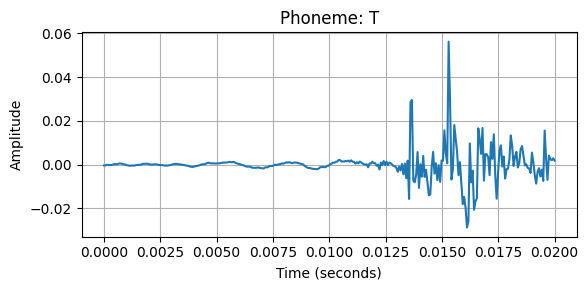

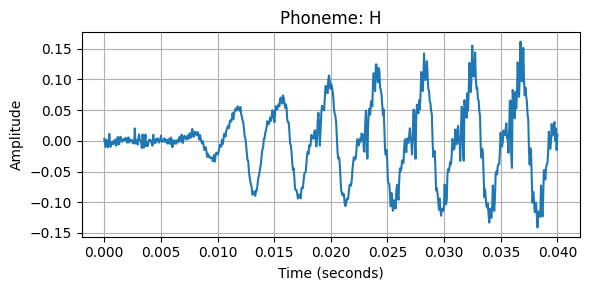

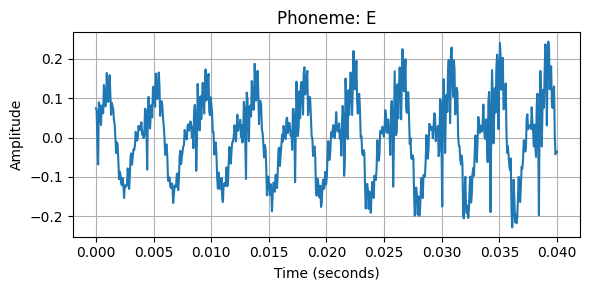

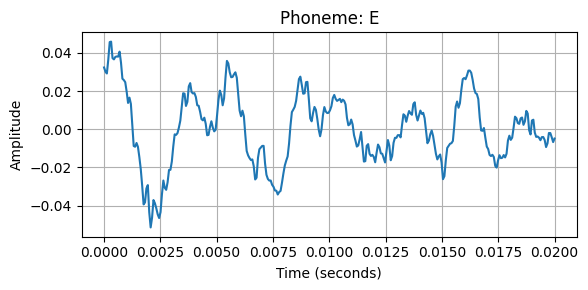

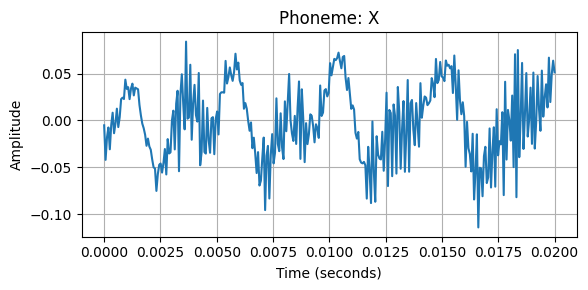

...

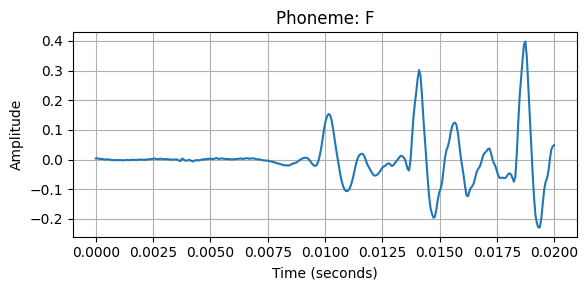

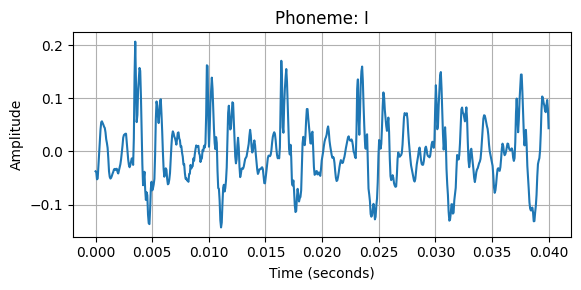

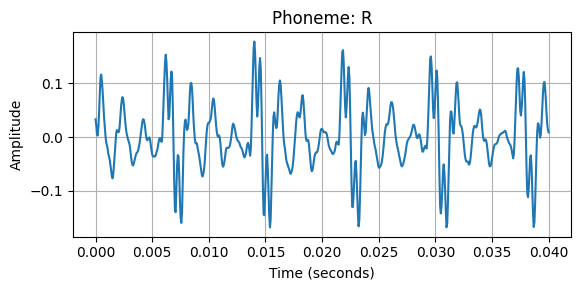

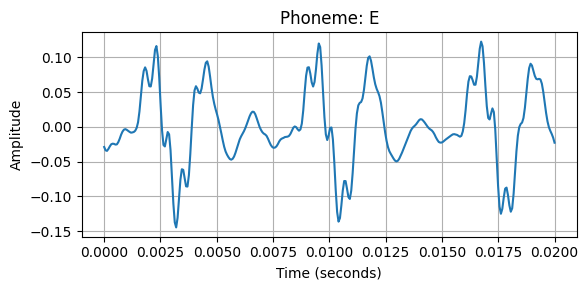

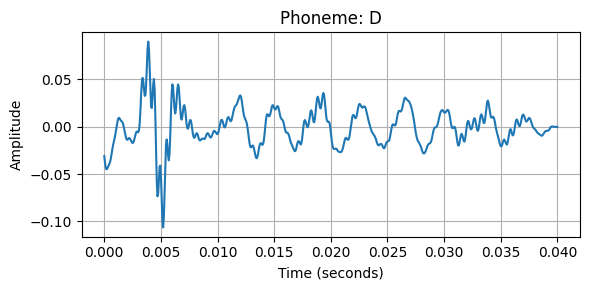

In [8]:
import numpy as np
import matplotlib.pyplot as plt
import librosa

def render_signal_segments(audio_path, segment_log, sample_rate=16000):
    """
    Visualizes discrete temporal windows from a source signal based on external metadata.
    """

    source_signal, _ = librosa.load(audio_path, sr=sample_rate)
    with open(segment_log, "r") as f:
        metadata = [line.strip().split(",") for line in f]

    for label, t_start, t_end, _ in metadata:
        start_idx, end_idx = int(float(t_start) * sample_rate), int(float(t_end) * sample_rate)
        fragment = source_signal[start_idx:end_idx]

        if fragment.size > 0:
            _plot_fragment(fragment, label, float(t_end) - float(t_start))

def _plot_fragment(data, label, duration):
    """Internal helper for graphical representation."""
    plt.figure(figsize=(6, 3))
    t = np.linspace(0, duration, len(data))

    plt.plot(t, data, color='teal', linewidth=1)
    plt.title(f"Segment Signature: {label}", fontsize=10)
    plt.xlabel("Offset (s)")
    plt.ylabel("Amp")
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

render_signal_segments(
    audio_path="/content/LJ037-0171.wav",
    segment_log="phoneme_segments.txt"
)

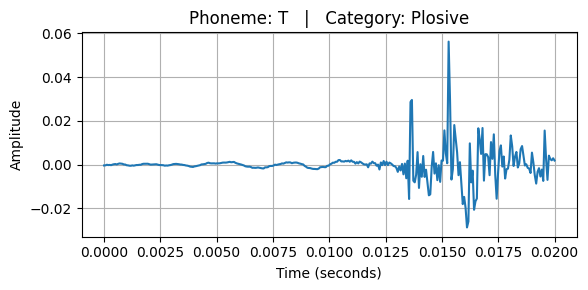

T --> Plosive


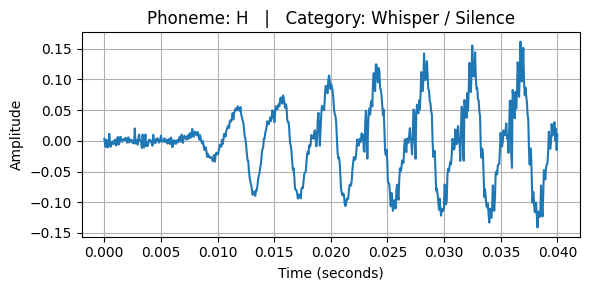

H --> Whisper / Silence


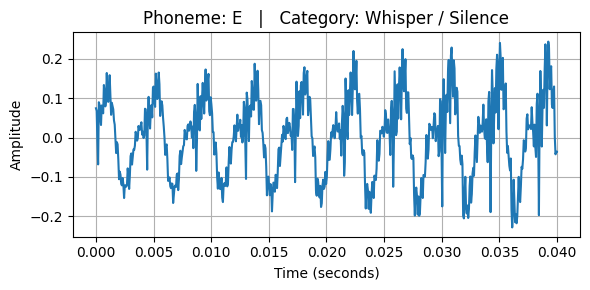

E --> Whisper / Silence


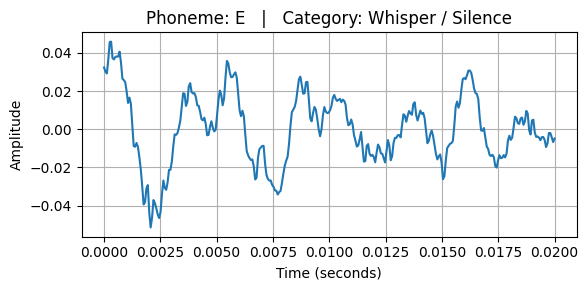

E --> Whisper / Silence


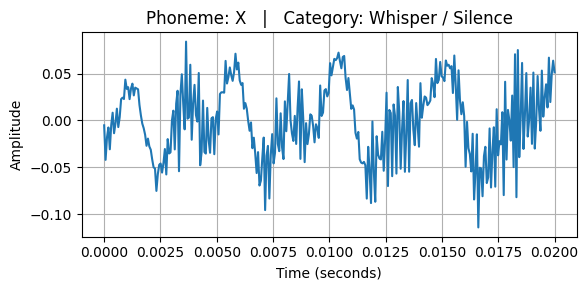

X --> Whisper / Silence


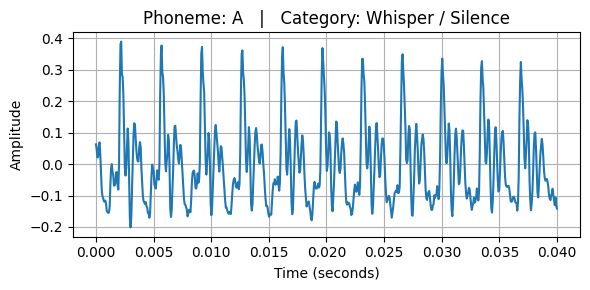

A --> Whisper / Silence


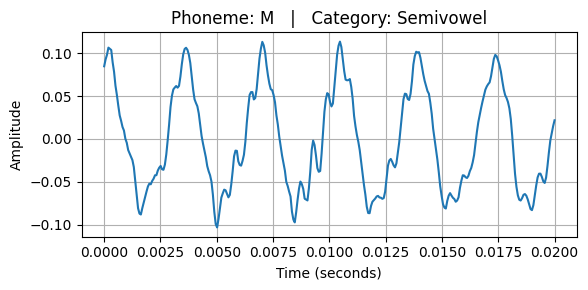

M --> Semivowel


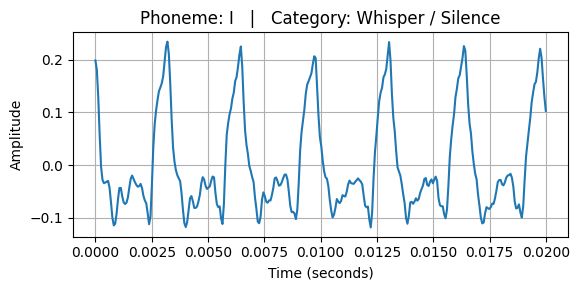

I --> Whisper / Silence


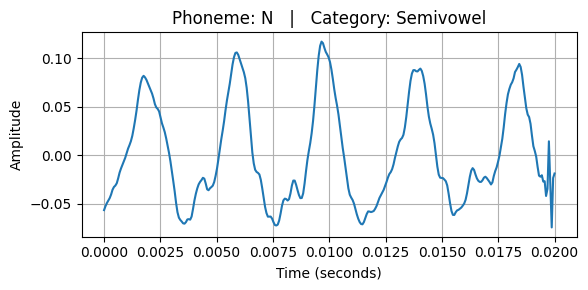

N --> Semivowel


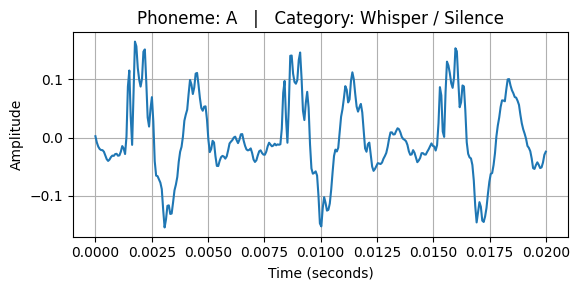

A --> Whisper / Silence


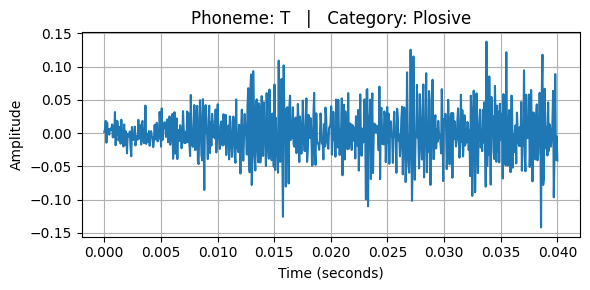

T --> Plosive


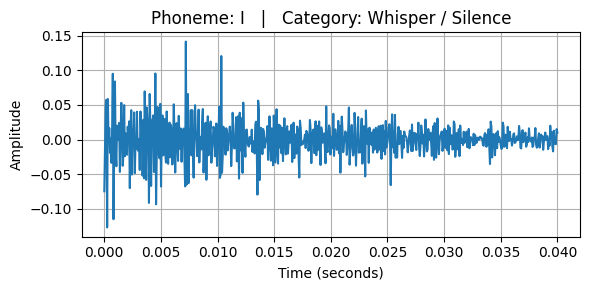

I --> Whisper / Silence


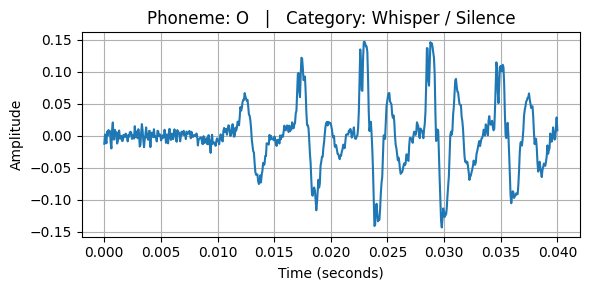

O --> Whisper / Silence


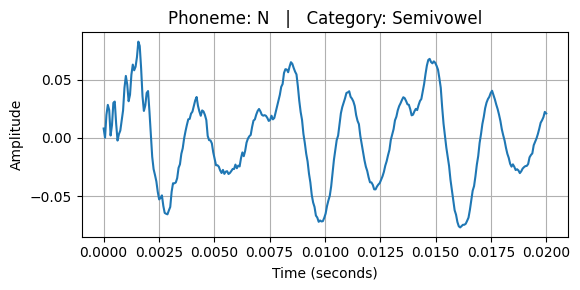

N --> Semivowel


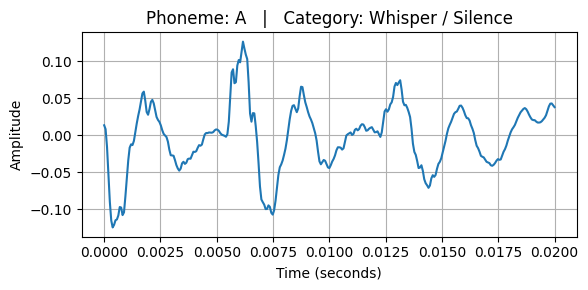

A --> Whisper / Silence


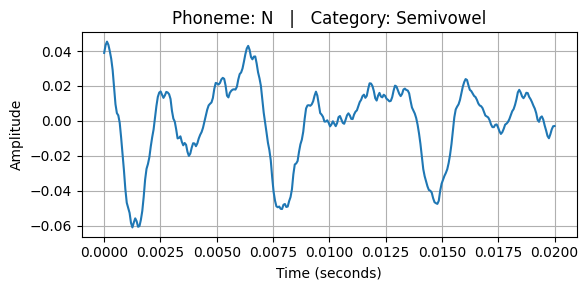

N --> Semivowel


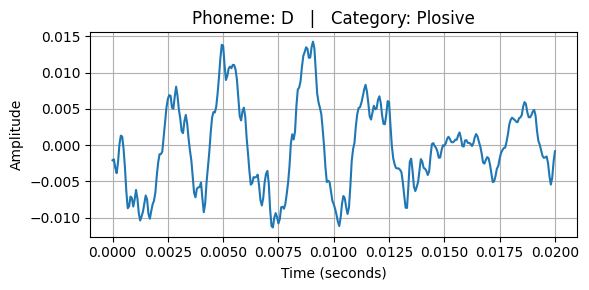

D --> Plosive


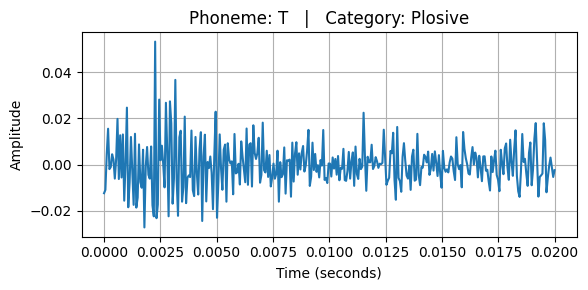

T --> Plosive


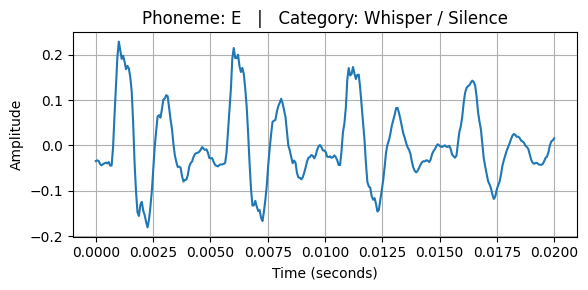

E --> Whisper / Silence


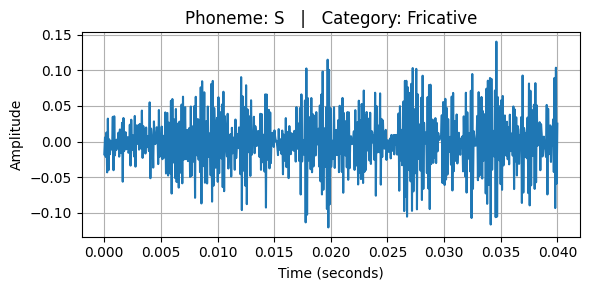

S --> Fricative


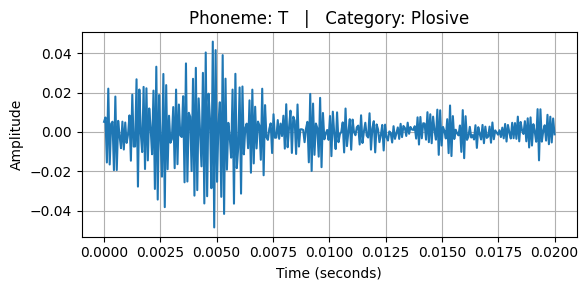

T --> Plosive


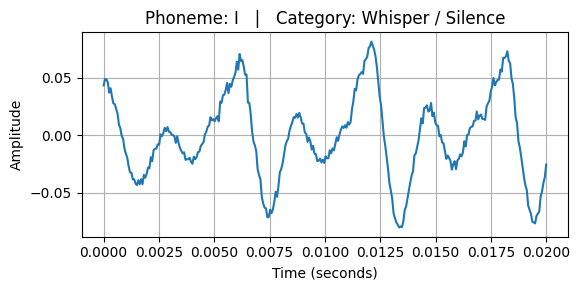

I --> Whisper / Silence


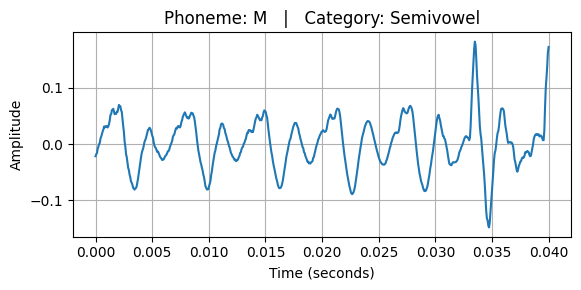

M --> Semivowel


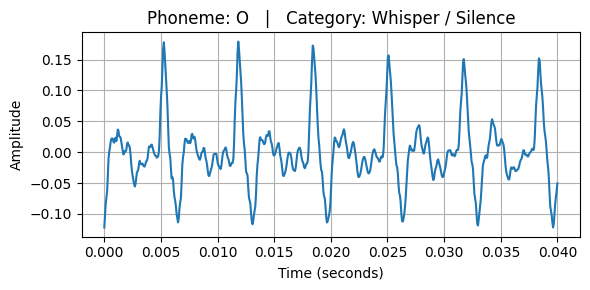

O --> Whisper / Silence


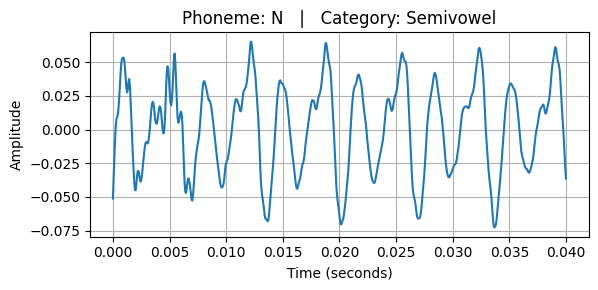

N --> Semivowel


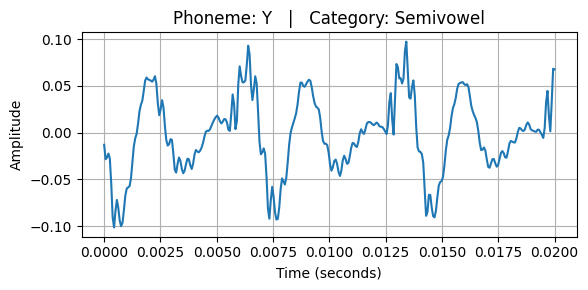

Y --> Semivowel


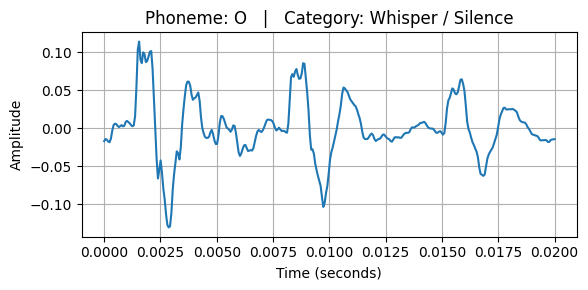

O --> Whisper / Silence


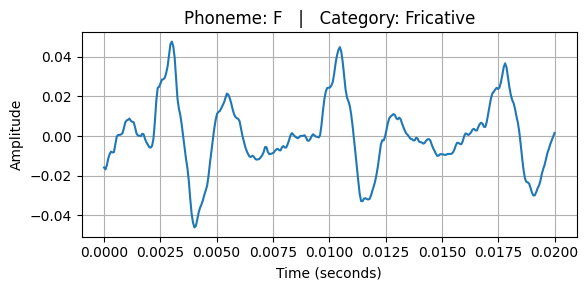

F --> Fricative


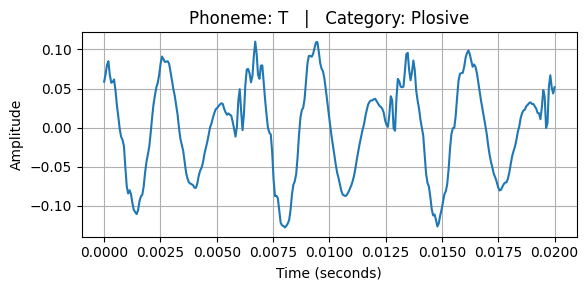

T --> Plosive


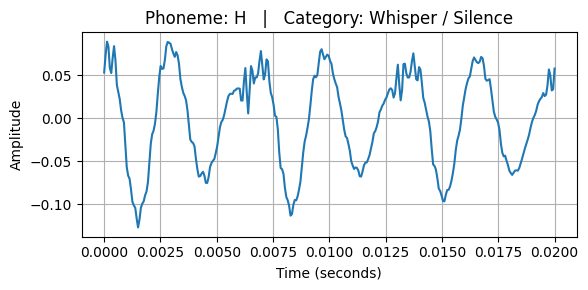

H --> Whisper / Silence


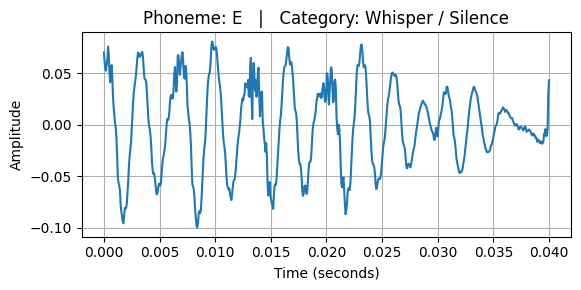

E --> Whisper / Silence


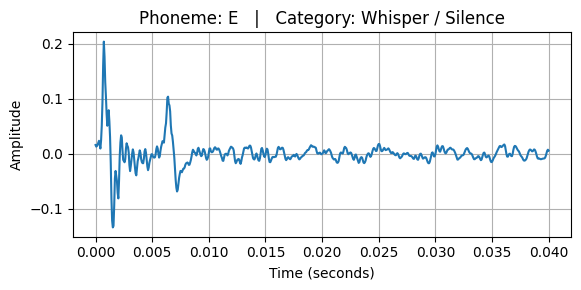

E --> Whisper / Silence


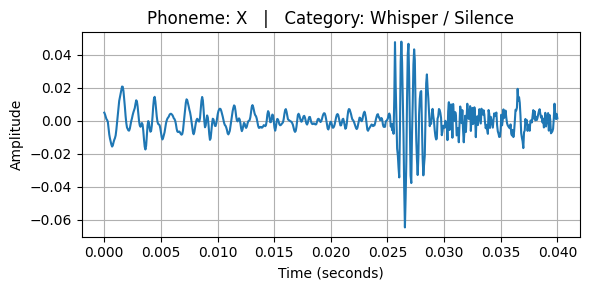

X --> Whisper / Silence


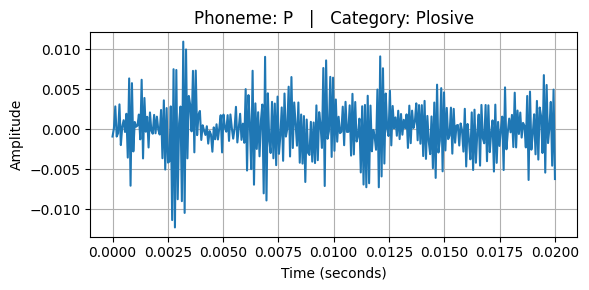

P --> Plosive


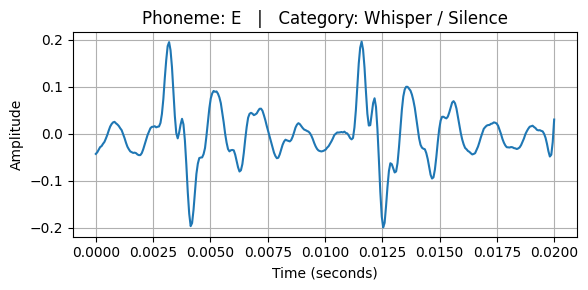

E --> Whisper / Silence


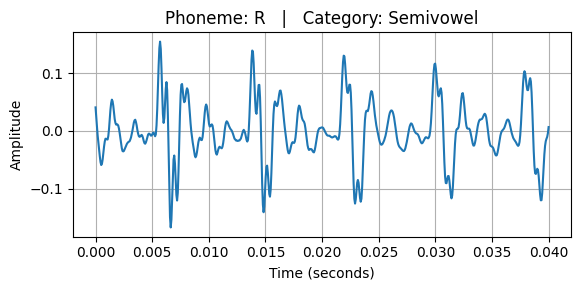

R --> Semivowel


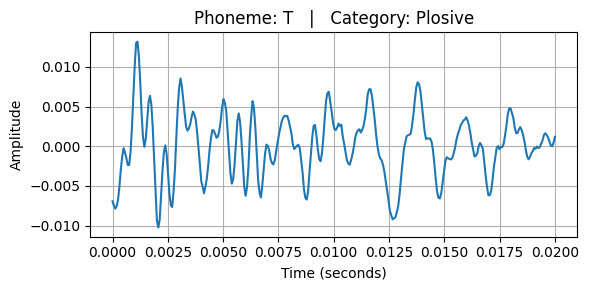

T --> Plosive


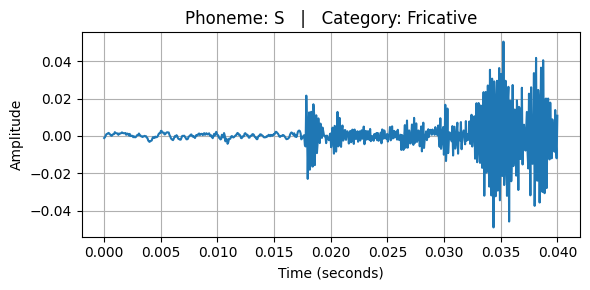

S --> Fricative


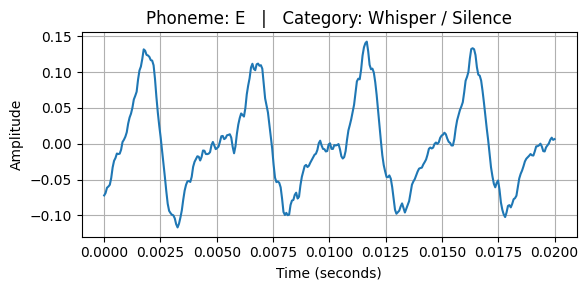

E --> Whisper / Silence


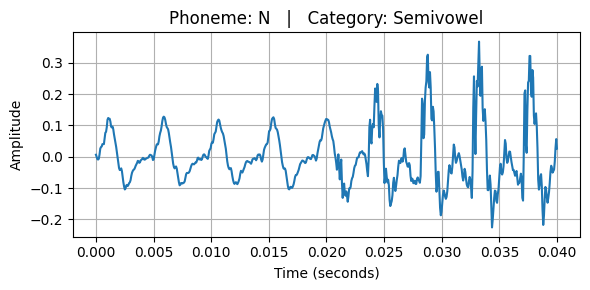

N --> Semivowel


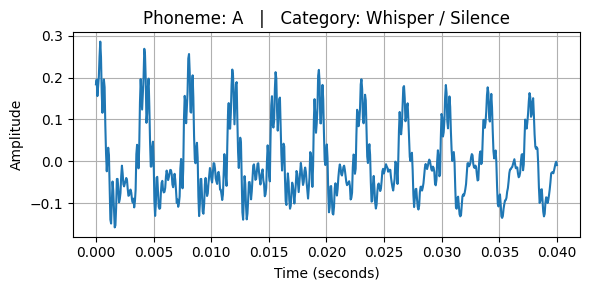

A --> Whisper / Silence


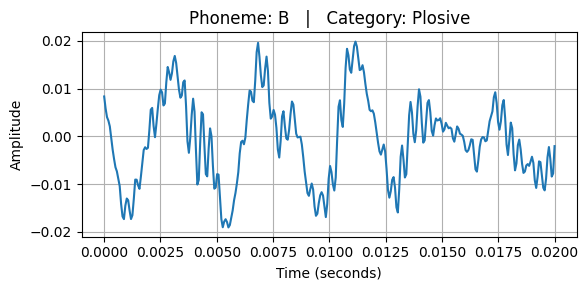

B --> Plosive


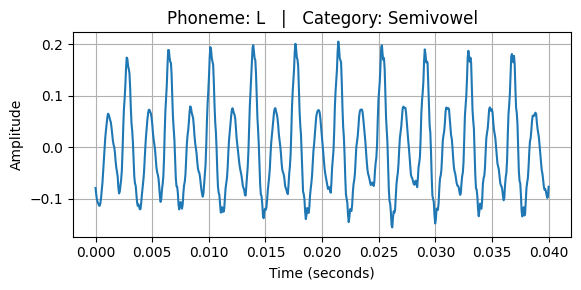

L --> Semivowel


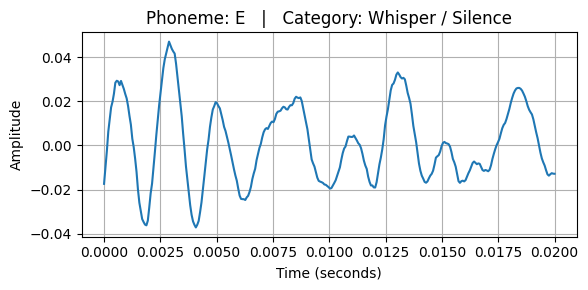

E --> Whisper / Silence


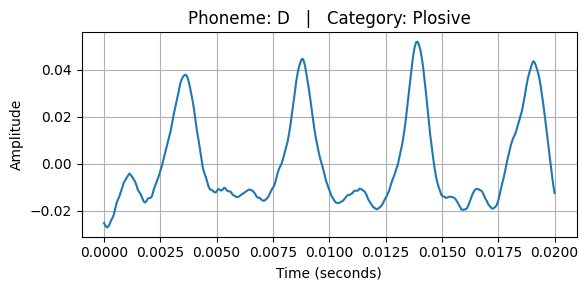

D --> Plosive


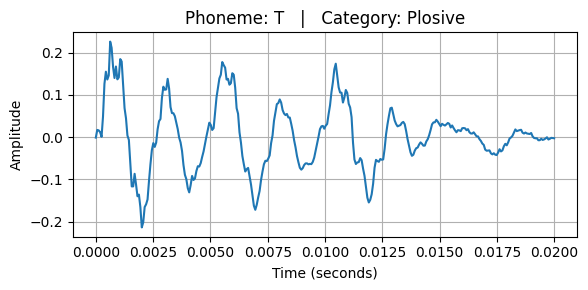

T --> Plosive


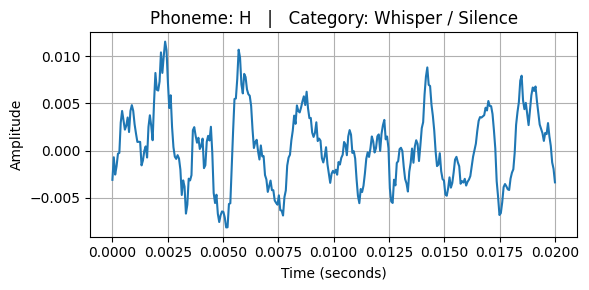

H --> Whisper / Silence


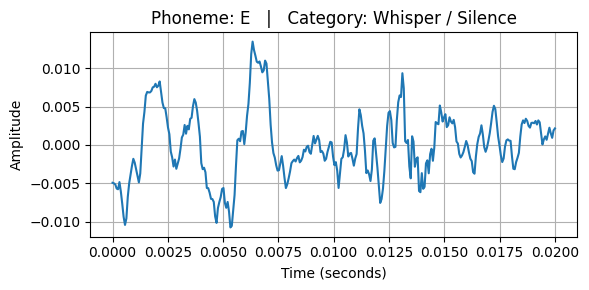

E --> Whisper / Silence


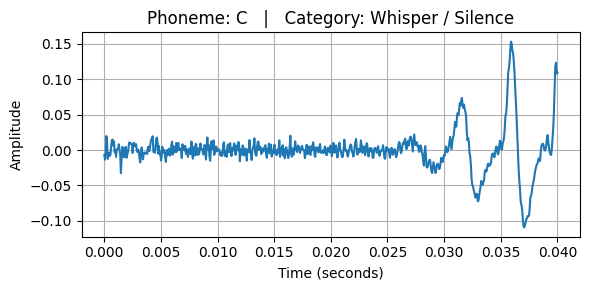

C --> Whisper / Silence


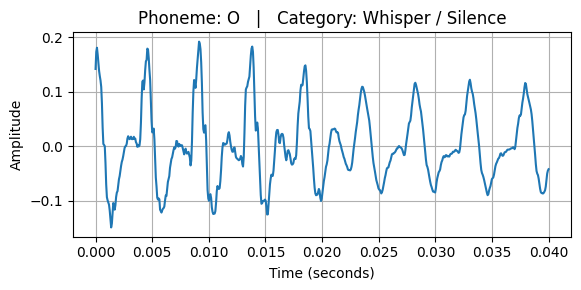

O --> Whisper / Silence


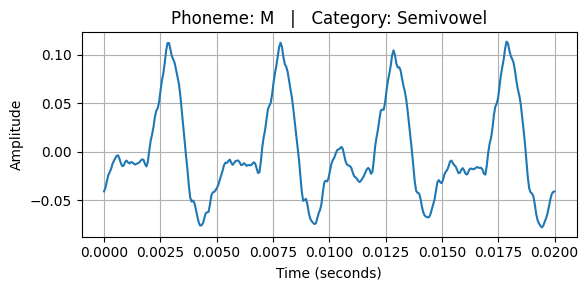

M --> Semivowel


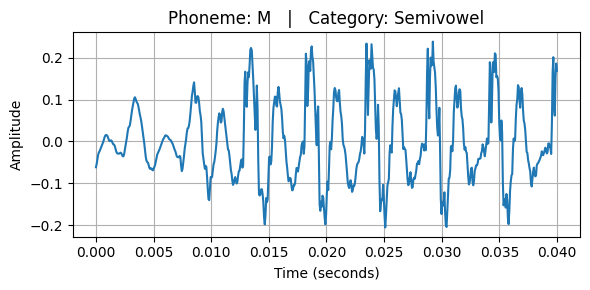

M --> Semivowel


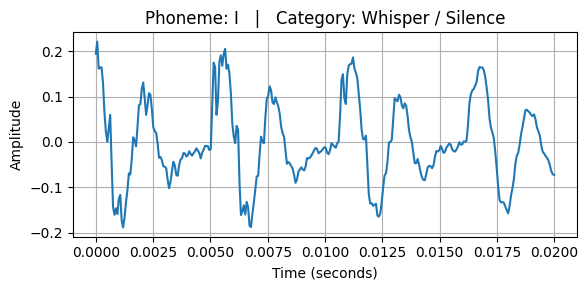

I --> Whisper / Silence


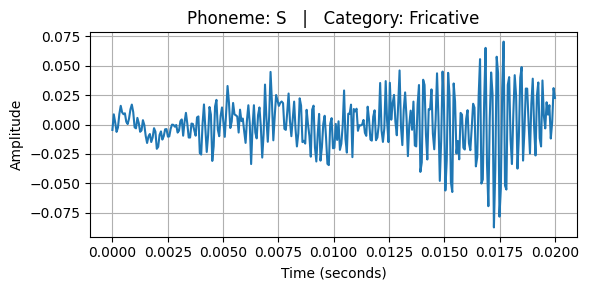

S --> Fricative


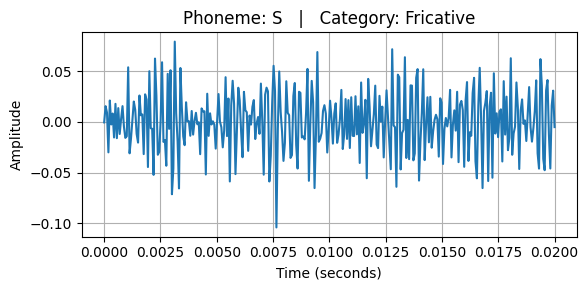

S --> Fricative


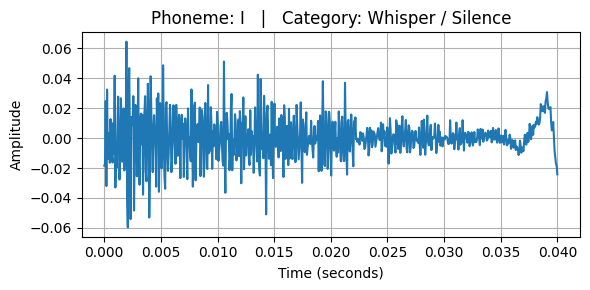

I --> Whisper / Silence


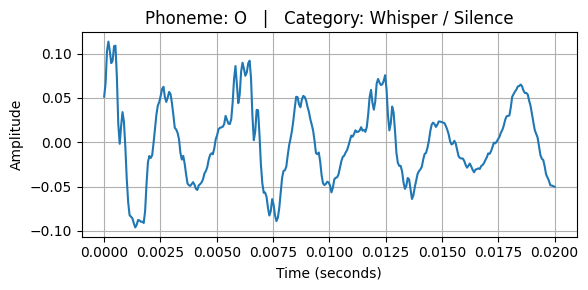

O --> Whisper / Silence


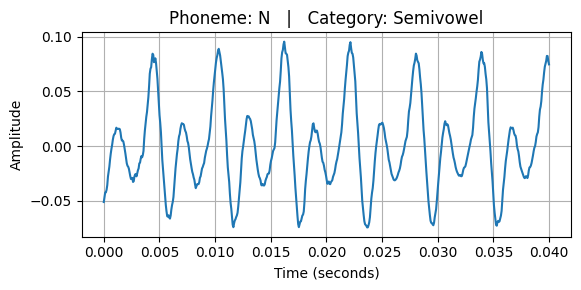

N --> Semivowel


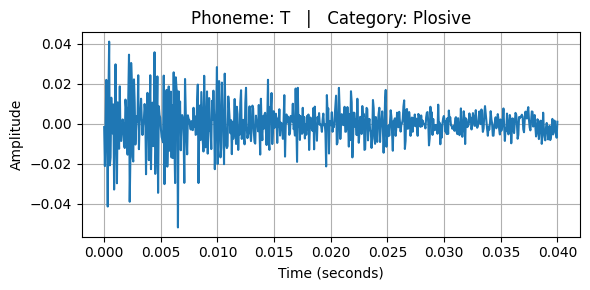

T --> Plosive


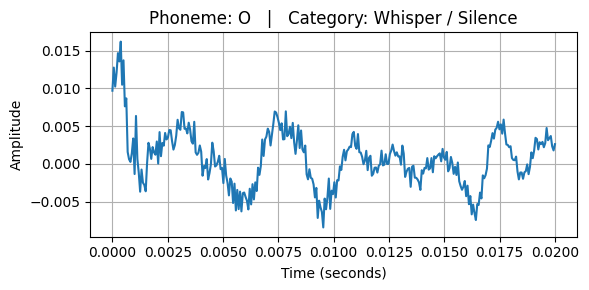

O --> Whisper / Silence


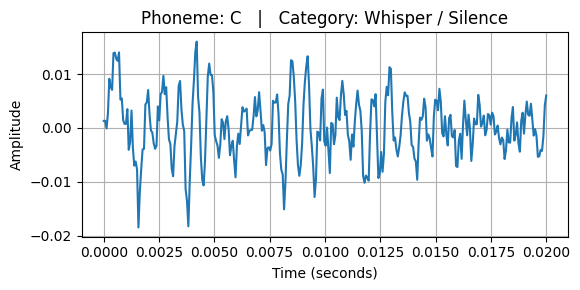

C --> Whisper / Silence


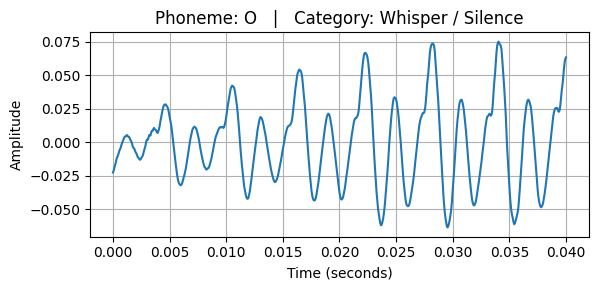

O --> Whisper / Silence


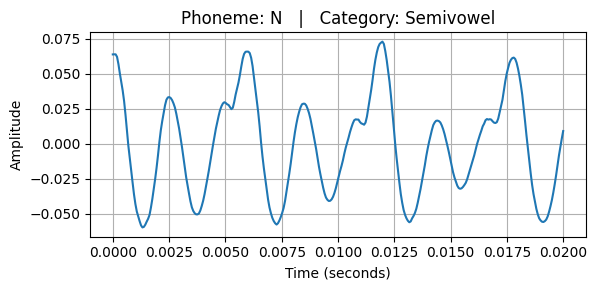

N --> Semivowel


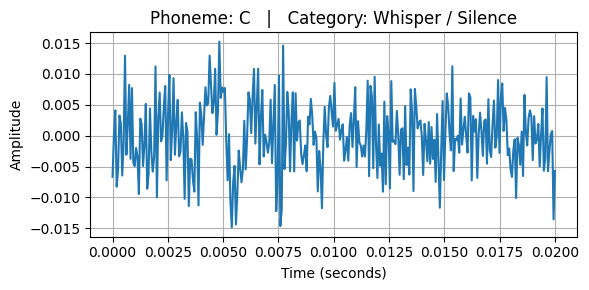

C --> Whisper / Silence


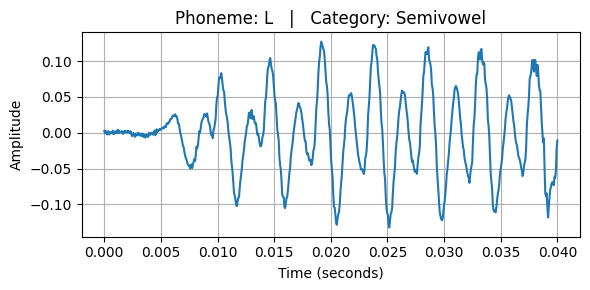

L --> Semivowel


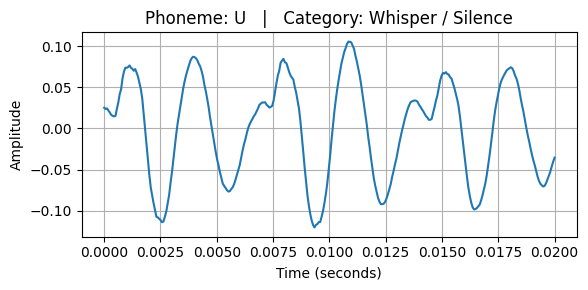

U --> Whisper / Silence


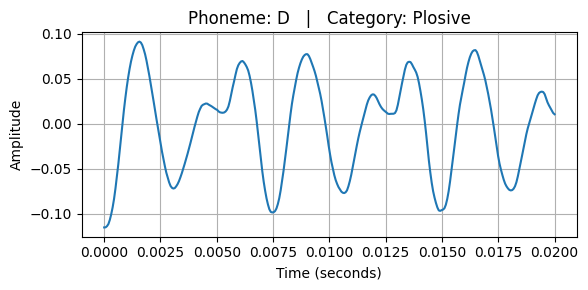

D --> Plosive


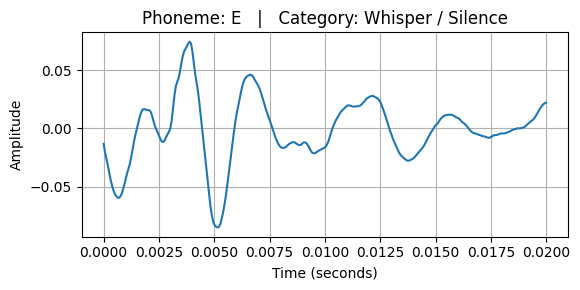

E --> Whisper / Silence


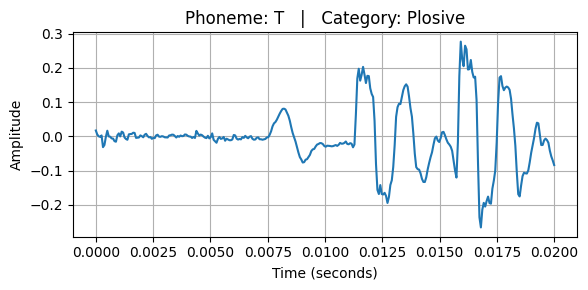

T --> Plosive


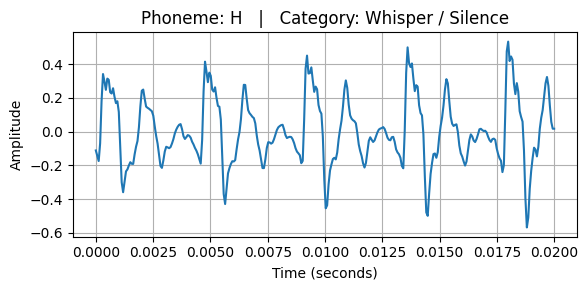

H --> Whisper / Silence


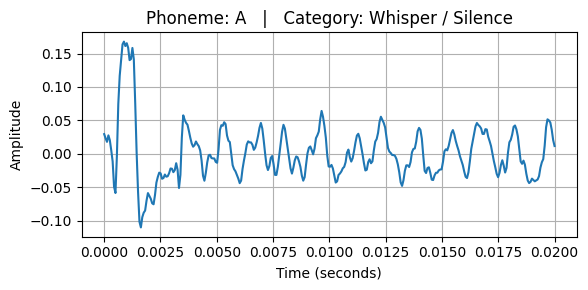

A --> Whisper / Silence


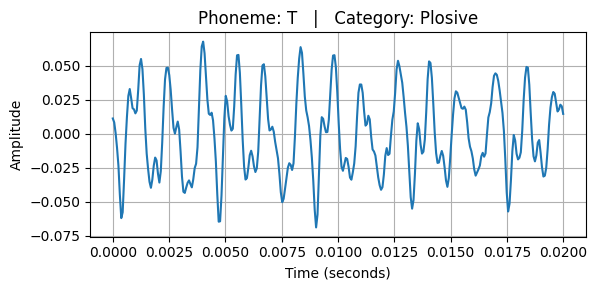

T --> Plosive


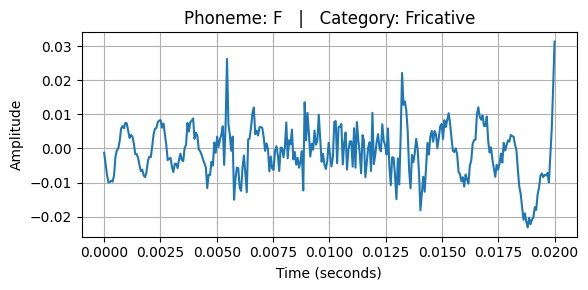

F --> Fricative


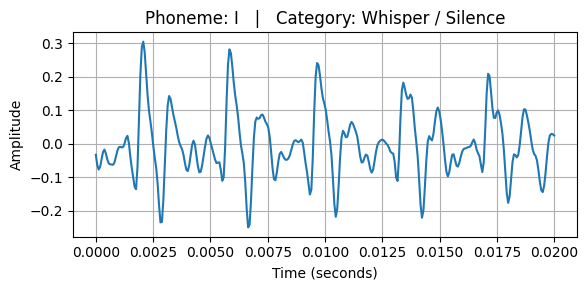

I --> Whisper / Silence


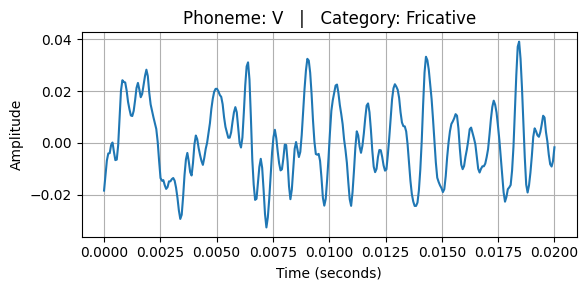

V --> Fricative


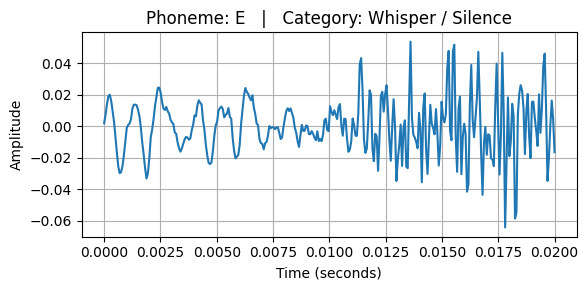

E --> Whisper / Silence


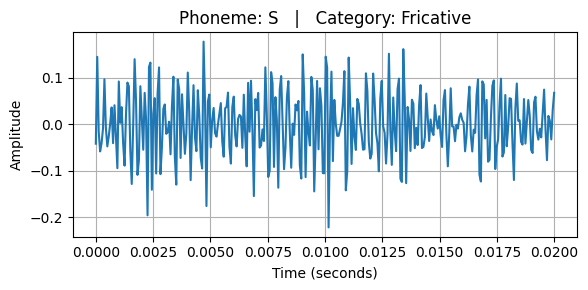

S --> Fricative


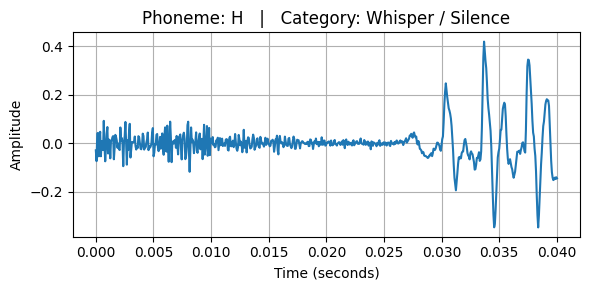

H --> Whisper / Silence


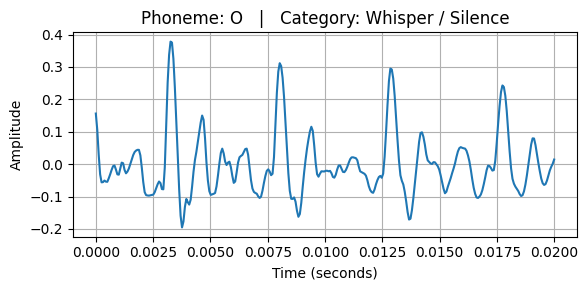

O --> Whisper / Silence


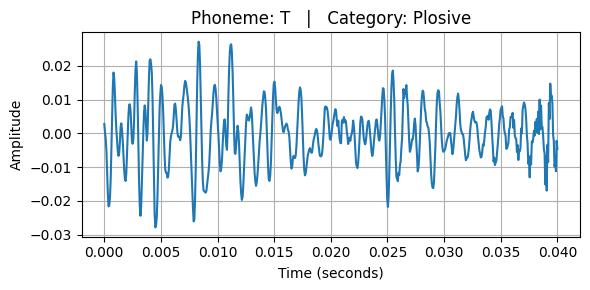

T --> Plosive


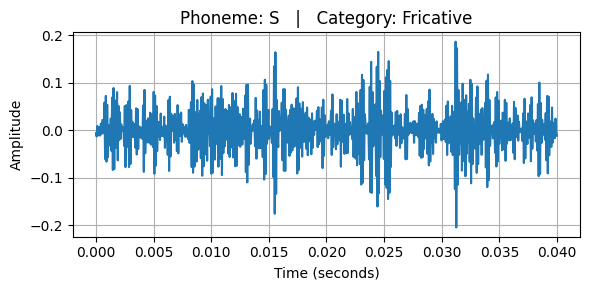

S --> Fricative


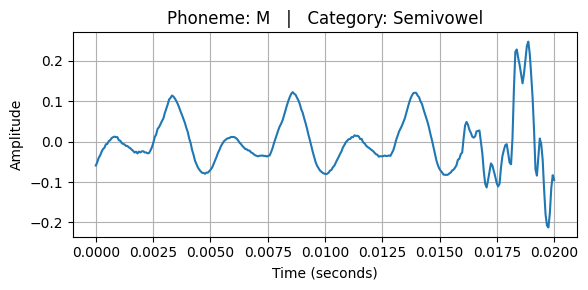

M --> Semivowel


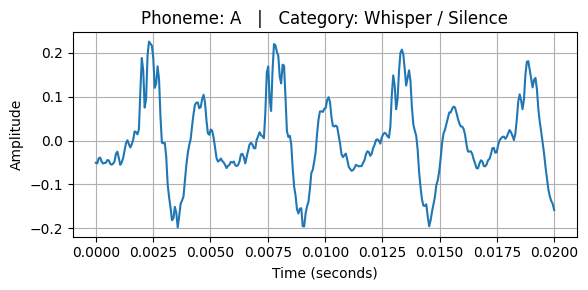

A --> Whisper / Silence


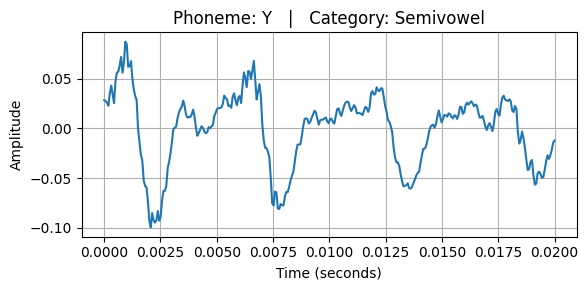

Y --> Semivowel


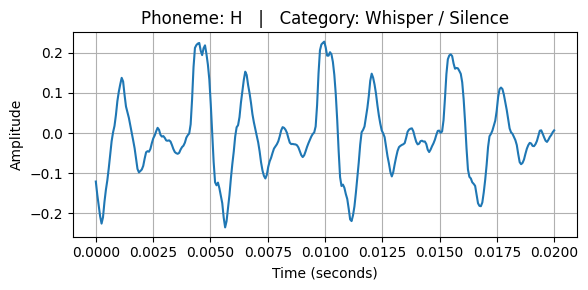

H --> Whisper / Silence


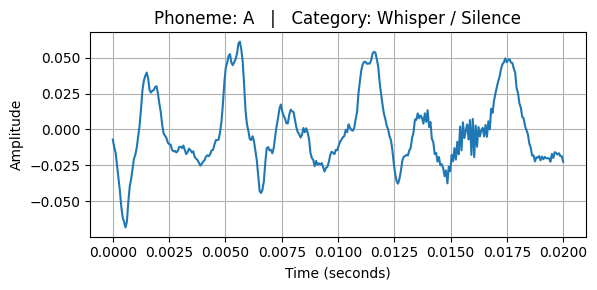

A --> Whisper / Silence


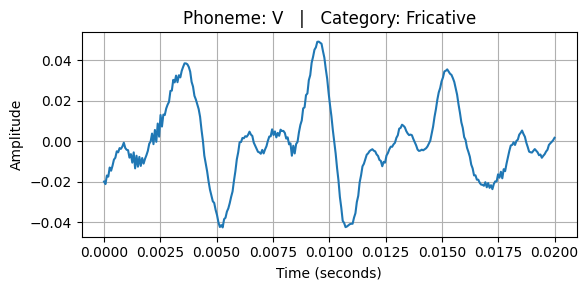

V --> Fricative


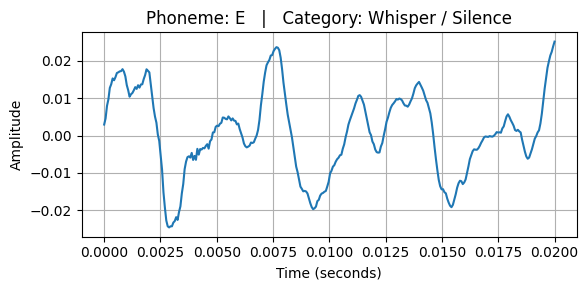

E --> Whisper / Silence


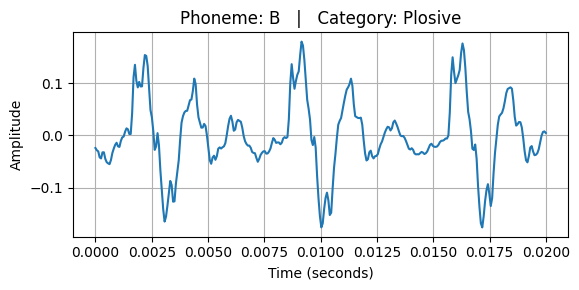

B --> Plosive


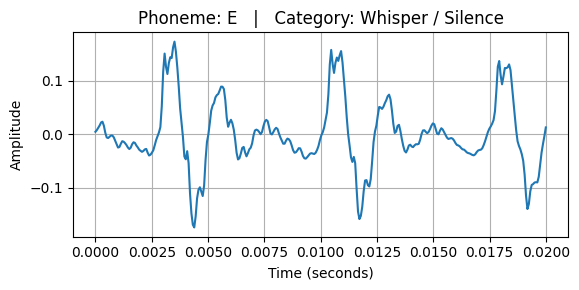

E --> Whisper / Silence


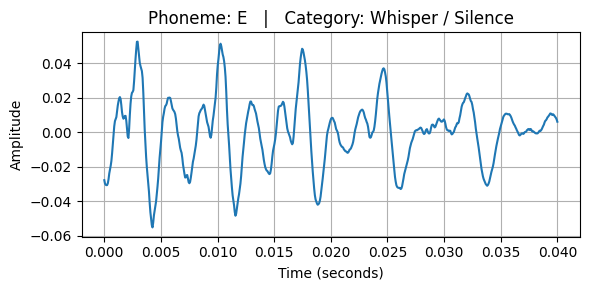

E --> Whisper / Silence


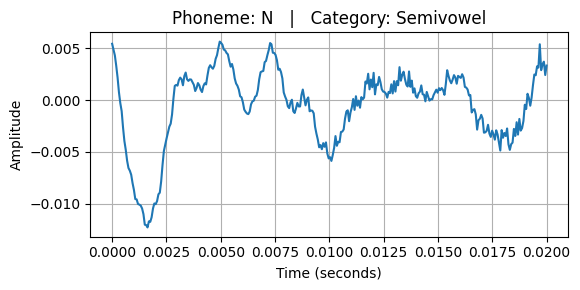

N --> Semivowel


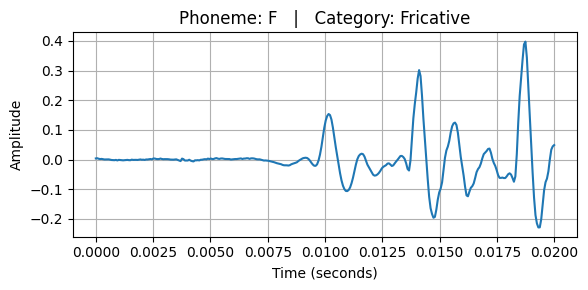

F --> Fricative


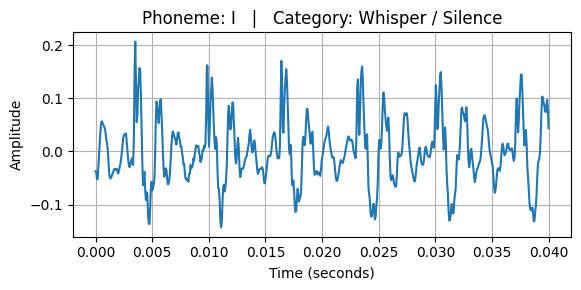

I --> Whisper / Silence


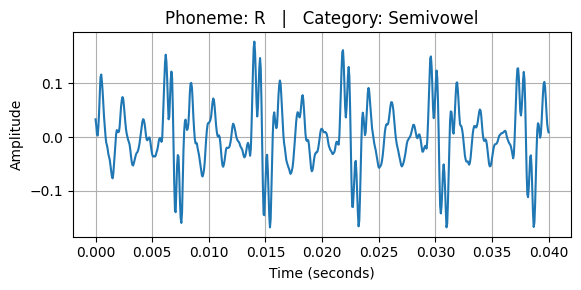

R --> Semivowel


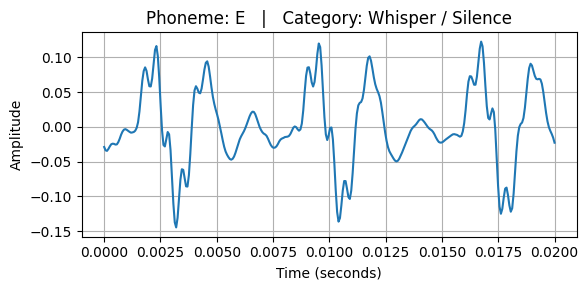

E --> Whisper / Silence


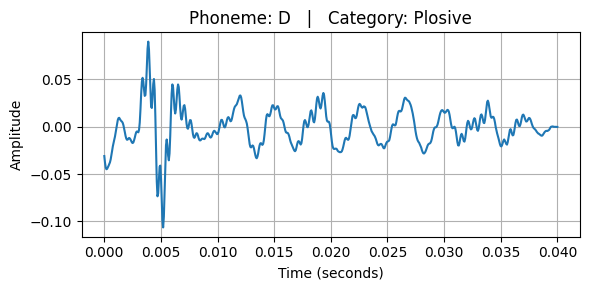

D --> Plosive


In [9]:
import numpy as np
import matplotlib.pyplot as plt
import librosa

class PhonemeAnalyzer:
    def __init__(self):
        self.registry = {
            **dict.fromkeys(["AA", "AE", "AH", "AO", "EH", "ER", "IH", "IY", "UH", "UW"], "Vowel"),
            **dict.fromkeys(["AW", "AY", "EY", "OW", "OY"], "Diphthong"),
            **dict.fromkeys(["P", "B", "T", "D", "K", "G"], "Plosive"),
            **dict.fromkeys(["F", "V", "S", "Z", "SH", "ZH", "TH", "DH", "HH"], "Fricative"),
            **dict.fromkeys(["CH", "JH"], "Affricate"),
            **dict.fromkeys(["L", "R", "W", "Y", "M", "N", "NG"], "Sonorant/Semivowel")
        }

    def categorize(self, token):
        """Resolves the phonetic group of a given token."""
        return self.registry.get(token.upper(), "Non-Speech / Silence")

    def visualize_segment(self, signal, label, duration):
        """Handles the graphical rendering of the acoustic signature."""
        category = self.categorize(label)
        time_axis = np.linspace(0, duration, len(signal))

        plt.figure(figsize=(7, 3))
        plt.plot(time_axis, signal, color='#2c3e50', alpha=0.8)
        plt.title(f"Target: [{label}] | Class: {category}", fontsize=11)
        plt.xlabel("Time (s)")
        plt.ylabel("Amplitude")
        plt.grid(True, linestyle='--', alpha=0.6)
        plt.tight_layout()
        plt.show()

        print(f"Detected: {label:5} | Attribute: {category}")

analyzer = PhonemeAnalyzer()
audio, fs = librosa.load("/content/LJ037-0171.wav", sr=16000)

with open("phoneme_segments.txt") as f:
    for line in f:
        token, start, end, duration = line.strip().split(",")
        s_idx, e_idx = int(float(start) * fs), int(float(end) * fs)
        slice_data = audio[s_idx:e_idx]

        if slice_data.size > 0:
            analyzer.visualize_segment(slice_data, token.strip(), float(duration))

Selected Voiced Phoneme: ('M', 0.482, 0.502, 0.02)
Selected Unvoiced Phoneme: ('T', 0.0, 0.02, 0.02)


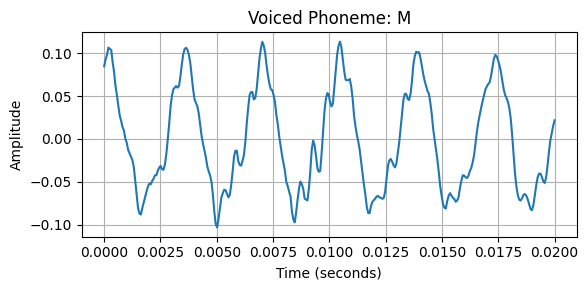

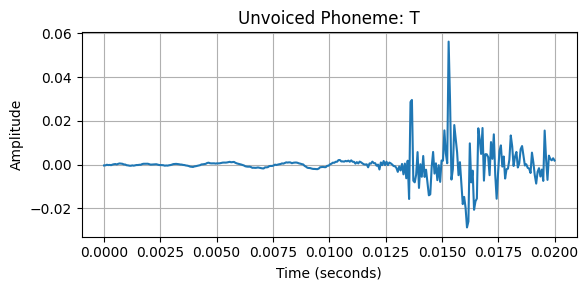

In [10]:
import numpy as np
import matplotlib.pyplot as plt
import librosa

class AcousticProfiler:
    def __init__(self):
        # Physical categorization based on glottal vibration
        self.voiced = {
            "AA","AE","AH","AO","EH","ER","IH","IY","UH","UW","AW","AY",
            "EY","OW","OY","B","D","G","V","Z","ZH","DH","JH","M","N","NG","L","R","W","Y"
        }
        self.unvoiced = {"P","T","K","F","S","SH","TH","CH","HH"}

    def isolate_representative_pair(self, segments):
        """Extracts the first occurrence of each acoustic class."""
        profiles = {'voiced': None, 'unvoiced': None}

        for p, s, e, d in segments:
            p_up = p.upper()
            if not profiles['voiced'] and p_up in self.voiced:
                profiles['voiced'] = (p_up, s, e, d)
            if not profiles['unvoiced'] and p_up in self.unvoiced:
                profiles['unvoiced'] = (p_up, s, e, d)

            if all(profiles.values()): break
        return profiles

    def compare_waveforms(self, profiles, audio, sr):
        """Renders the temporal characteristics of the selected pair."""
        for label, data in profiles.items():
            if not data: continue

            p, s, e, d = data
            signal_slice = audio[int(s*sr):int(e*sr)]
            t = np.linspace(0, d, len(signal_slice))

            plt.figure(figsize=(8, 3))
            plt.plot(t, signal_slice, color='navy' if label == 'voiced' else 'firebrick')
            plt.title(f"Acoustic Signature: {p} ({label.capitalize()})", fontsize=11)
            plt.ylabel("Amp")
            plt.grid(alpha=0.4)
            plt.tight_layout()
            plt.show()
profiler = AcousticProfiler()
audio_data, fs = librosa.load("/content/LJ037-0171.wav", sr=16000)
with open("phoneme_segments.txt") as f:
    raw_segments = [(line.split(",")[0], float(line.split(",")[1]),
                     float(line.split(",")[2]), float(line.split(",")[3])) for line in f]
targets = profiler.isolate_representative_pair(raw_segments)
profiler.compare_waveforms(targets, audio_data, fs)

In [13]:
import librosa
import soundfile as sf

SOURCE = "/content/LJ037-0171.wav"
TARGET = "/content/drive/MyDrive/Colab Notebooks/Speech Processing/Lab3/record2_16k_mono.wav"
RATE = 16000

data, fs = librosa.load(SOURCE, sr=RATE, mono=True)

print(f"Hz: {fs} | Count: {len(data)}")

sf.write(TARGET, data, fs)

Sampling Rate: 16000
Number of Samples: 121344


Sampling Rate: 16000
Total Samples: 121344
Fricative frames detected: 183
Approximant frames detected: 566

First 10 Fricative Regions (sec)
(0.0, 0.025)
(0.07, 0.095)
(0.08, 0.105)
(0.09, 0.115)
(0.1, 0.125)
(0.2, 0.225)
(0.21, 0.235)
(0.22, 0.245)
(0.23, 0.255)
(0.24, 0.265)

First 10 Approximant Regions (sec)
(0.01, 0.035)
(0.02, 0.045)
(0.03, 0.055)
(0.04, 0.065)
(0.05, 0.075)
(0.06, 0.085)
(0.11, 0.135)
(0.12, 0.145)
(0.13, 0.155)
(0.14, 0.165)


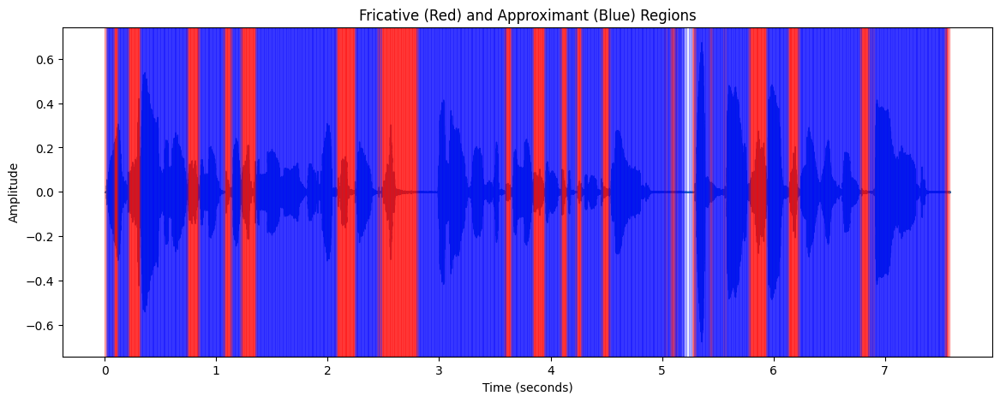

In [14]:
import numpy as np
import librosa
import librosa.display
import matplotlib.pyplot as plt

class SpectralDiscriminator:
    def __init__(self, sr=16000, win_ms=25, hop_ms=10):
        self.sr = sr
        self.win = int(win_ms * sr / 1000)
        self.hop = int(hop_ms * sr / 1000)

        # Define spectral boundaries
        self.freqs = np.fft.rfftfreq(self.win, d=1/sr)
        self.lo_idx = self.freqs <= 1000
        self.hi_idx = (self.freqs >= 3000) & (self.freqs <= 8000)

    def analyze_spectral_tilt(self, signal):
        """Categorizes signal frames based on energy distribution."""
        frames = librosa.util.frame(signal, frame_length=self.win, hop_length=self.hop)
        fricatives, approximants = [], []

        for i in range(frames.shape[1]):
            frame = frames[:, i]
            # Power evaluation
            if np.sum(frame**2) < 1e-4: continue

            spectrum = np.abs(np.fft.rfft(frame))

            # Energy comparison
            if np.sum(spectrum[self.hi_idx]) > np.sum(spectrum[self.lo_idx]):
                fricatives.append(self._get_bounds(i))
            else:
                approximants.append(self._get_bounds(i))

        return fricatives, approximants

    def _get_bounds(self, idx):
        """Maps frame index to temporal coordinates."""
        return (idx * self.hop / self.sr, (idx * self.hop + self.win) / self.sr)

# --- Process Workflow ---
audio, sr = librosa.load("/content/LJ037-0171.wav", sr=16000)
engine = SpectralDiscriminator(sr=sr)

# Execute Discrimination
hi_band_regions, lo_band_regions = engine.analyze_spectral_tilt(audio)

# Graphical Output
plt.figure(figsize=(14, 5))
librosa.display.waveshow(audio, sr=sr, alpha=0.5)
plt.title("Phonetic Segmentation: Spectral Energy Distribution")

# Vectorized-style highlighting
for s, e in hi_band_regions: plt.axvspan(s, e, color='crimson', alpha=0.3)
for s, e in lo_band_regions: plt.axvspan(s, e, color='royalblue', alpha=0.3)

plt.show()

In [15]:
import torch
import librosa
from transformers import Wav2Vec2Processor, Wav2Vec2ForCTC

class PhonemeAlignmentEngine:
    def __init__(self, model_name="facebook/wav2vec2-base-960h"):
        self.processor = Wav2Vec2Processor.from_pretrained(model_name)
        self.model = Wav2Vec2ForCTC.from_pretrained(model_name)

    def transcribe_with_timing(self, audio_path):
        # Data Ingestion
        speech, sr = librosa.load(audio_path, sr=16000)
        inputs = self.processor(speech, sampling_rate=sr, return_tensors="pt")

        # Inference
        with torch.no_grad():
            logits = self.model(inputs.input_values).logits

        # Temporal Mapping
        predicted_ids = torch.argmax(logits, dim=-1)[0].tolist()
        duration = len(speech) / sr
        time_scale = duration / len(predicted_ids)

        return self._build_segments(predicted_ids, time_scale), duration

    def _build_segments(self, ids, time_scale):
        segments = []
        start_idx = 0

        for i in range(1, len(ids)):
            if ids[i] != ids[start_idx]:
                token = self.processor.tokenizer.decode([ids[start_idx]])
                if token.strip():
                    segments.append((token, start_idx * time_scale, i * time_scale))
                start_idx = i

        # Handle trailing segment
        final_token = self.processor.tokenizer.decode([ids[start_idx]])
        if final_token.strip():
            segments.append((final_token, start_idx * time_scale, len(ids) * time_scale))

        return segments

# --- Execution ---
engine = PhonemeAlignmentEngine()
results, total_time = engine.transcribe_with_timing("/content/LJ037-0171.wav")

print(f"Total Duration: {total_time:.2f}s\n")
print(f"{'Phoneme':<10} | {'Start':<8} | {'End':<8} | {'Duration'}")
print("-" * 45)

with open("phoneme_segments1.txt", "w") as f:
    for p, s, e in results:
        dur = e - s
        print(f"{p:<10} | {s:<8.3f} | {e:<8.3f} | {dur:.3f}")
        f.write(f"{p},{s:.3f},{e:.3f},{dur:.3f}\n")

Sampling Rate: 16000
Audio Duration (sec): 7.584


Loading weights:   0%|          | 0/212 [00:00<?, ?it/s]

Wav2Vec2ForCTC LOAD REPORT from: facebook/wav2vec2-base-960h
Key                        | Status  | 
---------------------------+---------+-
wav2vec2.masked_spec_embed | MISSING | 

Notes:
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.



Recognized Phoneme/Character Sequence:

THE EXAMINATION AND TESTIMONY OF THE EXPERTS ENABLED THE COMMISSION TO CONCLUDE THAT FIVE SHOTS MAY HAVE BEEN FIRED

PHONEME-LEVEL SEGMENTATION WITH CONTINUATION

Phoneme | Start(s) | End(s) | Duration(s)
-------------------------------------------
T      |   0.000 |   0.020 |   0.020
H      |   0.020 |   0.060 |   0.040
E      |   0.060 |   0.100 |   0.040
E      |   0.181 |   0.201 |   0.020
X      |   0.221 |   0.241 |   0.020
A      |   0.401 |   0.441 |   0.040
M      |   0.482 |   0.502 |   0.020
I      |   0.542 |   0.562 |   0.020
N      |   0.582 |   0.602 |   0.020
A      |   0.682 |   0.702 |   0.020
T      |   0.742 |   0.782 |   0.040
I      |   0.803 |   0.843 |   0.040
O      |   0.843 |   0.883 |   0.040
N      |   0.883 |   0.903 |   0.020
A      |   0.983 |   1.003 |   0.020
N      |   1.003 |   1.023 |   0.020
D      |   1.023 |   1.043 |   0.020
T      |   1.103 |   1.124 |   0.020
E      |   1.184 |   1.204 |   0.020
S      

Total segments: 97
Fricative segments found: 6
Approximant segments found: 2


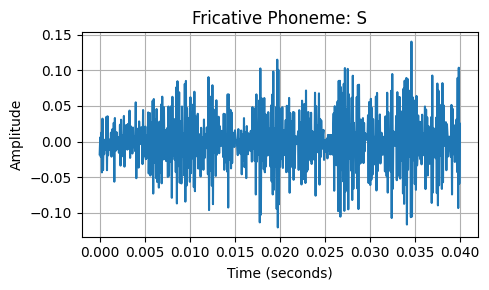

Saved: Fricative_S_0.wav


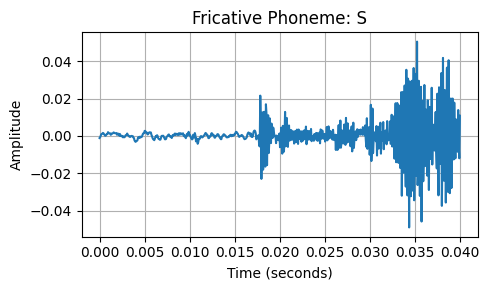

Saved: Fricative_S_1.wav


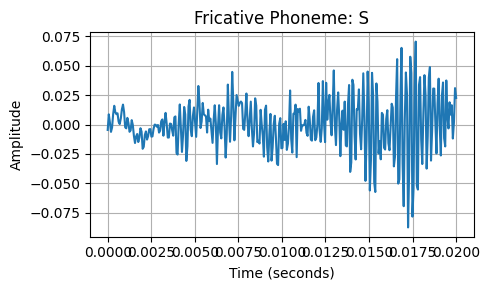

Saved: Fricative_S_2.wav


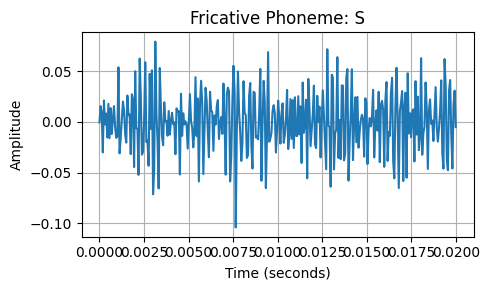

Saved: Fricative_S_3.wav


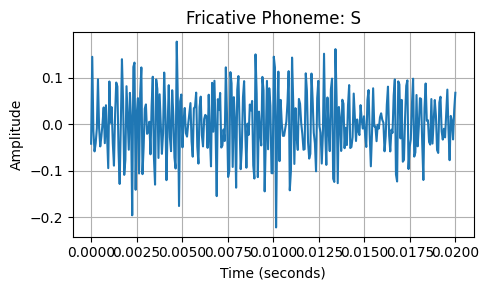

Saved: Fricative_S_4.wav


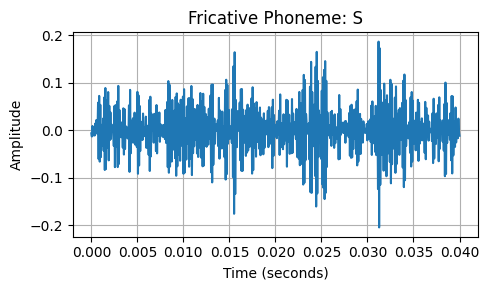

Saved: Fricative_S_5.wav


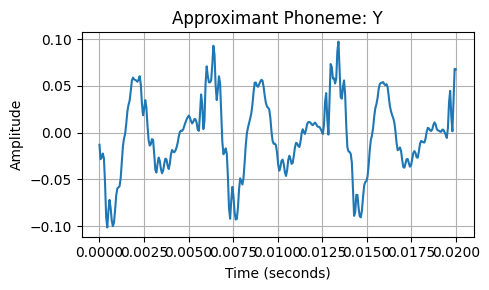

Saved: Approximant_Y_0.wav


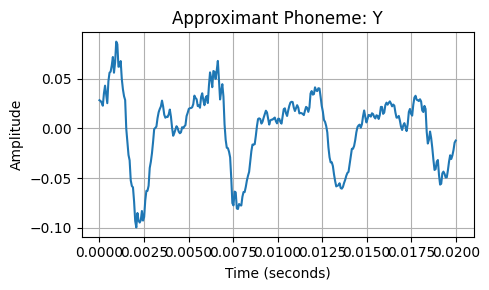

Saved: Approximant_Y_1.wav


In [16]:
import numpy as np
import librosa
import soundfile as sf
import matplotlib.pyplot as plt

class PhonemeExtractor:
    def __init__(self, audio_source, sr=16000):
        self.signal, self.sr = librosa.load(audio_source, sr=sr)
        self.targets = {
            "Fricative": {"S", "SH", "Z"},
            "Approximant": {"Y"}
        }

    def generate_assets(self, metadata_path):
        """Processes segments based on phonetic target categories."""
        results = []
        with open(metadata_path) as f:
            for line in f:
                token, s, e, d = line.strip().split(",")
                category = self._get_category(token.strip().upper())

                if category:
                    self._export_and_plot(token.strip(), float(s), float(e), float(d), category)

    def _get_category(self, token):
        for cat, tokens in self.targets.items():
            if token in tokens: return cat
        return None

    def _export_and_plot(self, phoneme, start, end, duration, category):
        # Slice and Persist
        start_sample, end_sample = int(start * self.sr), int(end * self.sr)
        fragment = self.signal[start_sample:end_sample]

        if fragment.size == 0: return

        # IO Operations
        out_name = f"{category}_{phoneme}_{start:.2f}.wav"
        sf.write(out_name, fragment, self.sr)

        # Visualization
        self._render(fragment, phoneme, category, duration)
        print(f"Exported {category} [{phoneme}] to {out_name}")

    def _render(self, data, label, category, d):
        plt.figure(figsize=(5, 3))
        plt.plot(np.linspace(0, d, len(data)), data, color='midnightblue', lw=0.8)
        plt.title(f"{category}: {label}")
        plt.grid(alpha=0.3)
        plt.tight_layout()
        plt.show()

# --- Execution ---
extractor = PhonemeExtractor("/content/LJ037-0171.wav")
extractor.generate_assets("phoneme_segments1.txt")